In [1]:
from acevedo_clss_and_fcns import *

/DeepenData/.miniconda/envs/geo/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
PYG_graph_Concen_plus_Fluxes = torch.load("./results/graphs_from_PYG_and_NX/PYG_graph_Concen_plus_Fluxes.pt") 
PYG_graph_only_Concen        = torch.load("./results/graphs_from_PYG_and_NX/PYG_graph_only_Concen.pt")

In [3]:
def make_graphs_list(pyg_graph_in,mask_target:bool=False, target_node:int = 0, mask_number = 0):
    
    pyg_graph = copy.deepcopy(pyg_graph_in)
    graphs_list = []
    
    
    for i in range(pyg_graph.x.shape[1]):
    
        
        new_pyg_data  = Data(x =  pyg_graph.x[:,i].reshape(pyg_graph.num_nodes, 1),  y = pyg_graph.y[i], 
                            edge_index = pyg_graph.edge_index)
        new_pyg_data.num_classes = int(2)
        if mask_target:
            new_pyg_data.x[target_node,:] = mask_number        
        
        graphs_list.append(new_pyg_data) 
    return graphs_list



graphs_list_PYG_graph_only_Concen = make_graphs_list(PYG_graph_only_Concen)
graphs_list_PYG_graph_Concen_plus_Fluxes = make_graphs_list(PYG_graph_Concen_plus_Fluxes)

In [4]:
def make_loader(graphs: list, batch_size: int  =2*32, num_samples = 20*32):#batch_size: int  =8*32):

    sampler_train_set = RandomSampler(
        graphs,
        #num_samples= num_samples, #params["training"]["sampler_num_samples"],  # Genera un muestreo del grafo
        replacement=True,  # con repeticion de muestras
    )
    return DataLoader(graphs, batch_size=batch_size, sampler = sampler_train_set,  drop_last=True)


loader_only_Concen   = make_loader(graphs_list_PYG_graph_only_Concen)
loader_Concen_plus_Fluxes   = make_loader(graphs_list_PYG_graph_Concen_plus_Fluxes)
torch.save(loader_only_Concen, "./results/dataloaders/loader_only_Concen.pt")
torch.save(loader_Concen_plus_Fluxes, "./results/dataloaders/loader_Concen_plus_Fluxes.pt")

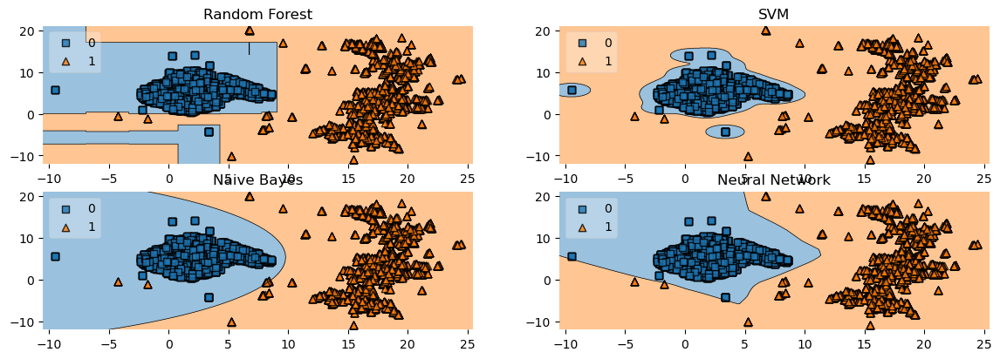

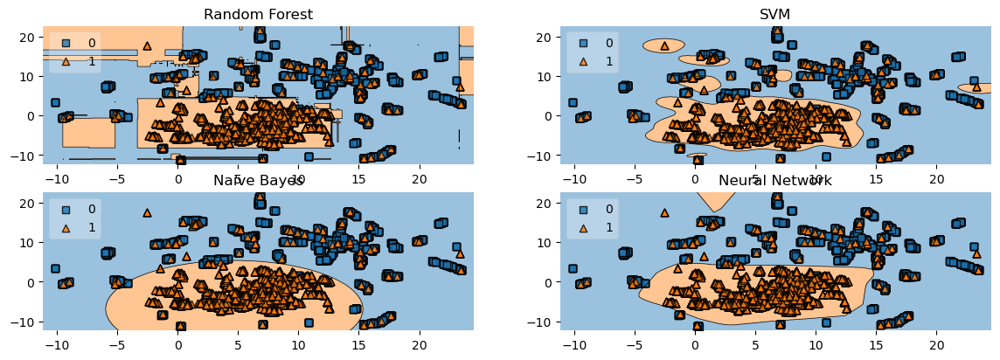

In [5]:
train_classifiers_with_dataloader(loader_only_Concen)
train_classifiers_with_dataloader(loader_Concen_plus_Fluxes)

In [6]:
torch.save(loader_only_Concen, "./results/dataloaders/loader_only_Concen.pt")
torch.save(loader_Concen_plus_Fluxes, "./results/dataloaders/loader_Concen_plus_Fluxes.pt")